# Weinreb et al. (2020) LARRY in-vitro data

This notebook downloads and performs an initial audit of the **in-vitro differentiation time course** from [Lineage tracing on transcriptional landscapes links state to fate during differentiation](https://github.com/AllonKleinLab/paper-data/tree/master/Lineage_tracing_on_transcriptional_landscapes_links_state_to_fate_during_differentiation). The GitHub page is the data catalogue; the matrices themselves are served by the Klein Lab URLs recorded there.

The four source files provide the cell-by-gene normalised expression matrix, gene names, cell metadata (including time, cell type and the technical inDrops cell barcode), and the binary cell-by-clone LARRY membership matrix. Downloads are cached under `~/Desktop/flow-maps-data/` by default.

In [10]:
# Imports and user settings
import gzip
import os
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import requests
from IPython.display import display
from scipy import sparse
from scipy.io import mmread
from tqdm.auto import tqdm

ROOT = next(
    (p for p in [Path.cwd(), *Path.cwd().parents]
     if (p / "notebooks").is_dir() and (p / "README.md").is_file()),
    Path.cwd(),
)
DATA_DIR = Path(os.getenv(
    "LARRY_INVITRO_DATA_DIR",
    str(Path.home() / "Desktop" / "flow-maps-data"),
)).expanduser()
DATA_DIR.mkdir(parents=True, exist_ok=True)

SOURCE_PAGE = (
    "https://github.com/AllonKleinLab/paper-data/tree/master/"
    "Lineage_tracing_on_transcriptional_landscapes_links_state_to_fate_"
    "during_differentiation"
)
BASE_URL = "https://kleintools.hms.harvard.edu/paper_websites/state_fate2020"
FILE_URLS = {
    "counts": f"{BASE_URL}/stateFate_inVitro_normed_counts.mtx.gz",
    "genes": f"{BASE_URL}/stateFate_inVitro_gene_names.txt.gz",
    "metadata": f"{BASE_URL}/stateFate_inVitro_metadata.txt.gz",
    "clones": f"{BASE_URL}/stateFate_inVitro_clone_matrix.mtx.gz",
}
FILE_PATHS = {k: DATA_DIR / url.rsplit("/", 1)[-1] for k, url in FILE_URLS.items()}

RUN_EXPLORATORY_PCA = True
N_HIGHLY_VARIABLE_GENES = 2_000
N_PCS = 50
RANDOM_SEED = 0

print(f"Repository root: {ROOT}")
print(f"Data directory:  {DATA_DIR}")
print(f"Source catalogue: {SOURCE_PAGE}")

Repository root: /Users/harryamad/Desktop/drive/2026/flow-maps
Data directory:  /Users/harryamad/Desktop/flow-maps-data
Source catalogue: https://github.com/AllonKleinLab/paper-data/tree/master/Lineage_tracing_on_transcriptional_landscapes_links_state_to_fate_during_differentiation


## Download the source files

Existing files are reused. New downloads are written to `.part` files and moved into place only after a complete gzip payload has been received.

In [2]:
def format_bytes(n_bytes):
    value = float(n_bytes)
    for unit in ("B", "KiB", "MiB", "GiB", "TiB"):
        if value < 1024 or unit == "TiB":
            return f"{value:.1f} {unit}"
        value /= 1024


def assert_gzip_file(path):
    with path.open("rb") as handle:
        signature = handle.read(2)
    if signature != b"\x1f\x8b":
        raise RuntimeError(f"Expected gzip data but received another payload: {path}")


def download_file(url, destination, chunk_size=8 * 1024 * 1024):
    destination.parent.mkdir(parents=True, exist_ok=True)
    if destination.is_file() and destination.stat().st_size > 0:
        assert_gzip_file(destination)
        print(f"Reusing {destination.name} ({format_bytes(destination.stat().st_size)})")
        return destination

    partial = destination.with_name(destination.name + ".part")
    headers = {"User-Agent": "flow-maps-data-notebook/1.0"}
    with requests.get(url, stream=True, timeout=(15, 180), headers=headers) as response:
        response.raise_for_status()
        total = int(response.headers.get("Content-Length", 0)) or None
        with partial.open("wb") as output, tqdm(
            total=total, unit="B", unit_scale=True, desc=destination.name
        ) as progress:
            for chunk in response.iter_content(chunk_size=chunk_size):
                if chunk:
                    output.write(chunk)
                    progress.update(len(chunk))
    assert_gzip_file(partial)
    partial.replace(destination)
    return destination


for key, url in FILE_URLS.items():
    download_file(url, FILE_PATHS[key])

download_manifest = pd.DataFrame([
    {
        "component": key,
        "file": path.name,
        "compressed_size": format_bytes(path.stat().st_size),
        "path": str(path),
    }
    for key, path in FILE_PATHS.items()
])
display(download_manifest)

stateFate_inVitro_normed_counts.mtx.gz: 100%|██████████| 2.07G/2.07G [06:36<00:00, 5.21MB/s]
stateFate_inVitro_gene_names.txt.gz: 100%|██████████| 65.7k/65.7k [00:00<00:00, 4.40MB/s]
stateFate_inVitro_metadata.txt.gz: 100%|██████████| 2.21M/2.21M [00:00<00:00, 3.06MB/s]
stateFate_inVitro_clone_matrix.mtx.gz: 100%|██████████| 198k/198k [00:00<00:00, 676kB/s]


,component,file,compressed_size,path
0,counts,stateFate_inVitro_normed_counts.mtx.gz,1.9 GiB,/Users/harryamad/Desktop/flow-maps-data/stateF...
1,genes,stateFate_inVitro_gene_names.txt.gz,64.1 KiB,/Users/harryamad/Desktop/flow-maps-data/stateF...
2,metadata,stateFate_inVitro_metadata.txt.gz,2.1 MiB,/Users/harryamad/Desktop/flow-maps-data/stateF...
3,clones,stateFate_inVitro_clone_matrix.mtx.gz,193.1 KiB,/Users/harryamad/Desktop/flow-maps-data/stateF...


## Load and align the matrices

The source documentation states that rows of the expression matrix, clone matrix and metadata are aligned. The checks below fail loudly if their dimensions disagree, while keeping both matrices sparse.

In [3]:
def read_sparse_mtx_gz(path):
    with gzip.open(path, "rb") as handle:
        matrix = mmread(handle)
    return matrix.tocsr() if sparse.issparse(matrix) else sparse.csr_matrix(matrix)


with gzip.open(FILE_PATHS["genes"], "rt") as handle:
    gene_names = pd.Index([line.rstrip("\r\n") for line in handle], name="gene")
metadata = pd.read_csv(FILE_PATHS["metadata"], sep="\t", compression="gzip")
metadata.columns = metadata.columns.astype(str).str.strip()
metadata = metadata.reset_index(drop=True)
expression = read_sparse_mtx_gz(FILE_PATHS["counts"])
clone_matrix = read_sparse_mtx_gz(FILE_PATHS["clones"])

n_cells = len(metadata)
if expression.shape == (len(gene_names), n_cells):
    print("Transposing expression matrix to cells x genes.")
    expression = expression.T.tocsr()
if clone_matrix.shape[0] != n_cells and clone_matrix.shape[1] == n_cells:
    print("Transposing clone matrix to cells x clones.")
    clone_matrix = clone_matrix.T.tocsr()
if expression.shape != (n_cells, len(gene_names)):
    raise ValueError(
        f"Expression shape {expression.shape} does not match "
        f"{n_cells} metadata rows and {len(gene_names)} gene names."
    )
if clone_matrix.shape[0] != n_cells:
    raise ValueError(
        f"Clone-matrix shape {clone_matrix.shape} does not match {n_cells} metadata rows."
    )

print(f"Expression: {expression.shape[0]:,} cells x {expression.shape[1]:,} genes")
print(f"Lineage:    {clone_matrix.shape[0]:,} cells x {clone_matrix.shape[1]:,} clones")
sparse_bytes = expression.data.nbytes + expression.indices.nbytes + expression.indptr.nbytes
print(f"Sparse expression storage: {format_bytes(sparse_bytes)}")

Expression: 130,887 cells x 25,289 genes
Lineage:    130,887 cells x 5,864 clones
Sparse expression storage: 2.0 GiB


In [4]:
# Standardise useful fields while retaining every source column.
EXPECTED_COLUMNS = [
    "Library", "Cell barcode", "Time point",
    "Starting population", "Cell type annotation", "Well",
]
missing = [column for column in EXPECTED_COLUMNS if column not in metadata.columns]
if missing:
    raise KeyError(
        f"Missing metadata columns {missing}. Available: {metadata.columns.tolist()}"
    )

metadata.insert(0, "cell_index", np.arange(len(metadata), dtype=np.int64))
metadata["technical_cell_barcode"] = metadata["Cell barcode"].astype("string")
metadata["cell_id"] = (
    metadata["Library"].astype("string") + ":"
    + metadata["technical_cell_barcode"]
)
metadata["cell_type"] = (
    metadata["Cell type annotation"].astype("string").fillna("missing")
)
metadata["starting_population"] = (
    metadata["Starting population"].astype("string").fillna("missing")
)

time_text = metadata["Time point"].astype("string")
metadata["day"] = pd.to_numeric(time_text, errors="coerce")
unparsed = metadata["day"].isna()
metadata.loc[unparsed, "day"] = pd.to_numeric(
    time_text[unparsed].str.extract(r"(\d+(?:\.\d+)?)", expand=False),
    errors="coerce",
)
if metadata["day"].isna().any():
    bad = metadata.loc[metadata["day"].isna(), "Time point"].unique()
    raise ValueError(f"Could not parse time points: {bad.tolist()}")
metadata["day_label"] = metadata["day"].map(lambda value: f"D{value:g}")
day_order = [f"D{value:g}" for value in sorted(metadata["day"].unique())]

metadata["n_clone_assignments"] = np.asarray(clone_matrix.getnnz(axis=1)).ravel()
metadata["has_clone"] = metadata["n_clone_assignments"] > 0
metadata["has_single_clone"] = metadata["n_clone_assignments"] == 1
metadata["clone_id"] = pd.Series(
    pd.array([pd.NA] * len(metadata), dtype="Int64"), index=metadata.index
)
single_rows = np.flatnonzero(metadata["has_single_clone"].to_numpy())
metadata.loc[single_rows, "clone_id"] = clone_matrix[single_rows].indices + 1
metadata["n_genes_detected"] = np.asarray(expression.getnnz(axis=1)).ravel()
metadata["normalised_library_sum"] = np.asarray(expression.sum(axis=1)).ravel()

display(metadata[[
    "cell_index", "cell_id", "day_label", "starting_population",
    "cell_type", "Well", "clone_id", "n_genes_detected",
]].head())

,cell_index,cell_id,day_label,starting_population,cell_type,Well,clone_id,n_genes_detected
0,0,d6_2_2:GCGTGCAA-AGAAGTTA,D6,Lin-Kit+Sca1-,Undifferentiated,2,574,4513
1,1,d6_2_2:AAGGGACC-CTCGATGC,D6,Lin-Kit+Sca1-,Undifferentiated,2,1441,3484
2,2,d6_2_2:CGTACCGA-AGCGCCTT,D6,Lin-Kit+Sca1-,Monocyte,2,395,2662
3,3,d6_2_2:CTGAAGGG-AGGAGCTT,D6,Lin-Kit+Sca1-,Neutrophil,2,<NA>,2704
4,4,d6_2_2:CCGTAGCT-AGGCAGTT,D6,Lin-Kit+Sca1-,Undifferentiated,2,1973,1865


## Dataset overview, cell counts and cell types

In [5]:
clone_sizes = np.asarray(clone_matrix.getnnz(axis=0)).ravel()
dataset_summary = pd.Series({
    "Cells": len(metadata),
    "Genes": len(gene_names),
    "Sampling times": metadata["day"].nunique(),
    "Cell-type labels": metadata["cell_type"].nunique(),
    "Starting populations": metadata["starting_population"].nunique(),
    "Nonzero expression entries": int(expression.nnz),
    "Expression density": expression.nnz / np.prod(expression.shape),
    "Active clones": int((clone_sizes > 0).sum()),
    "Cells with a clone": int(metadata["has_clone"].sum()),
    "Cells assigned to multiple clones": int((metadata["n_clone_assignments"] > 1).sum()),
    "Duplicated Library:cell-barcode IDs": int(metadata["cell_id"].duplicated().sum()),
    "Duplicated gene symbols": int(gene_names.duplicated().sum()),
}, name="value")
display(dataset_summary.to_frame())

cell_counts_by_day = metadata.groupby("day_label", observed=True).size().reindex(day_order)
cell_type_counts = (
    metadata.groupby(["day_label", "cell_type"], observed=True).size()
    .unstack(fill_value=0).reindex(day_order, fill_value=0)
)
cell_type_order = cell_type_counts.sum(axis=0).sort_values(ascending=False).index
cell_type_counts = cell_type_counts.loc[:, cell_type_order]
cell_type_percent = cell_type_counts.div(cell_type_counts.sum(axis=1), axis=0) * 100

print("Cell counts by day")
display(cell_counts_by_day.rename("cells").to_frame())
print("Cell-type counts by day")
display(cell_type_counts)
print("Cell-type composition by day (%)")
display(cell_type_percent.round(2))

print("Starting-population counts by day")
display(pd.crosstab(
    metadata["day_label"], metadata["starting_population"]
).reindex(day_order, fill_value=0))
print("Well counts by day")
display(pd.crosstab(
    metadata["day_label"], metadata["Well"], dropna=False
).reindex(day_order, fill_value=0))

,value
Cells,1.308870e+05
Genes,2.528900e+04
Sampling times,3.000000e+00
Cell-type labels,1.100000e+01
Starting populations,2.000000e+00
Nonzero expression entries,1.768676e+08
Expression density,5.343429e-02
Active clones,5.864000e+03
Cells with a clone,4.930200e+04
Cells assigned to multiple clones,0.000000e+00


Cell counts by day


,cells
day_label,
D2,28249
D4,48498
D6,54140


Cell-type counts by day


cell_type,Undifferentiated,Neutrophil,Monocyte,Baso,Mast,Meg,Lymphoid,Erythroid,Eos,Ccr7_DC,pDC
day_label,,,,,,,,,,,
D2,25575,1068,950,187,40,97,144,100,15,57,16
D4,28727,6721,7505,3247,579,632,583,153,189,100,62
D6,17891,14448,10727,6721,1965,1367,130,433,351,84,23


Cell-type composition by day (%)


cell_type,Undifferentiated,Neutrophil,Monocyte,Baso,Mast,Meg,Lymphoid,Erythroid,Eos,Ccr7_DC,pDC
day_label,,,,,,,,,,,
D2,90.53,3.78,3.36,0.66,0.14,0.34,0.51,0.35,0.05,0.20,0.06
D4,59.23,13.86,15.47,6.70,1.19,1.30,1.20,0.32,0.39,0.21,0.13
D6,33.05,26.69,19.81,12.41,3.63,2.52,0.24,0.80,0.65,0.16,0.04


Starting-population counts by day


starting_population,Lin-Kit+Sca1+,Lin-Kit+Sca1-
day_label,,
D2,20456,7793
D4,29451,19047
D6,23039,31101


Well counts by day


Well,0,1,2
day_label,,,
D2,28249,0,0
D4,0,21300,27198
D6,0,24511,29629


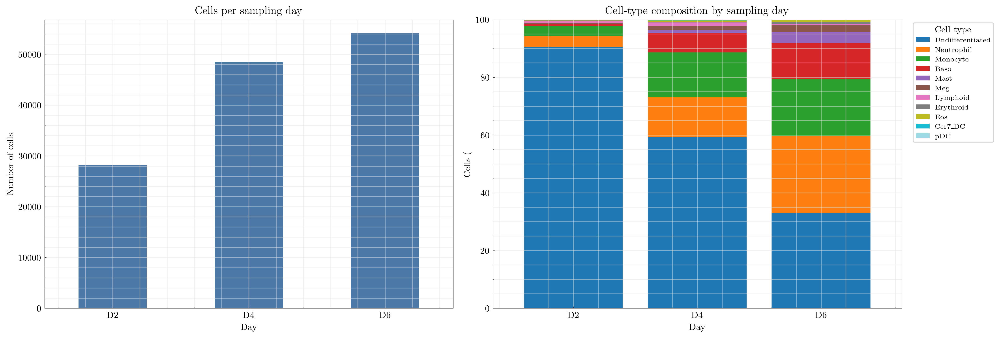

In [6]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)
cell_counts_by_day.plot(kind="bar", ax=axes[0], color="#4C78A8")
axes[0].set(title="Cells per sampling day", xlabel="Day", ylabel="Number of cells")
axes[0].tick_params(axis="x", rotation=0)

cell_type_percent.plot(
    kind="bar", stacked=True, ax=axes[1], colormap="tab20", width=0.8
)
axes[1].set(
    title="Cell-type composition by sampling day",
    xlabel="Day", ylabel="Cells (%)", ylim=(0, 100),
)
axes[1].tick_params(axis="x", rotation=0)
axes[1].legend(title="Cell type", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.show()

## Expression coverage and gene summaries

The supplied matrix has already undergone total-count normalisation. Thus, `normalised_library_sum` describes the supplied representation rather than raw sequencing depth. The number of nonzero genes per cell remains useful for comparing expression coverage.

,cells,median_genes_detected,mean_genes_detected,median_normalised_sum,mean_normalised_sum
day_label,,,,,
D2,28249,1238.0,1455.36,2878.75,2878.75
D4,48498,1240.0,1338.63,2878.75,2878.75
D6,54140,1177.0,1308.35,2878.75,2878.75


Most widely detected genes


,gene,cells_detected,fraction_cells_detected,mean_normalised_expression
0,mt-Co2,130729,0.998793,59.050718
1,mt-Atp6,130550,0.997425,41.591714
2,mt-Co1,130515,0.997158,31.802958
3,Gapdh,130469,0.996806,25.703354
4,Eef1a1,129939,0.992757,26.475730
5,mt-Nd4,129791,0.991626,23.074266
6,mt-Nd1,129663,0.990648,31.522952
7,mt-Cytb,129524,0.989586,21.844921
8,Actg1,128536,0.982038,14.856002
9,Rpl23,128443,0.981327,13.954145


Genes with the highest mean normalised expression


,gene,cells_detected,fraction_cells_detected,mean_normalised_expression
0,mt-Co2,130729,0.998793,59.050718
1,mt-Atp6,130550,0.997425,41.591714
2,mt-Co1,130515,0.997158,31.802958
3,mt-Nd1,129663,0.990648,31.522952
4,Eef1a1,129939,0.992757,26.475730
5,S100a9,40220,0.307288,26.128505
6,Gapdh,130469,0.996806,25.703354
7,mt-Nd4,129791,0.991626,23.074266
8,mt-Cytb,129524,0.989586,21.844921
9,Ngp,25779,0.196956,18.907009


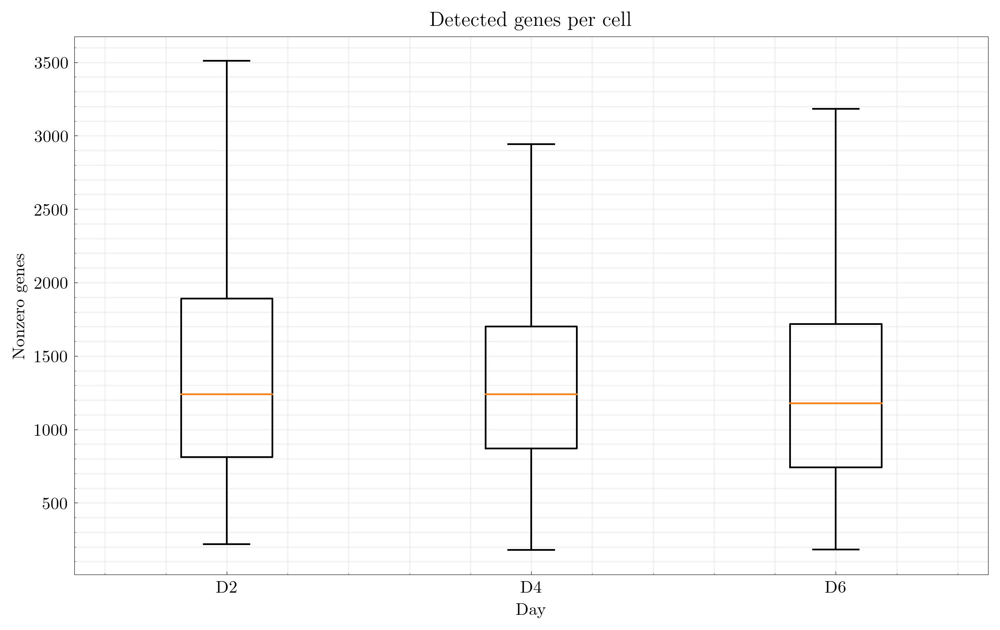

In [7]:
qc_by_day = (
    metadata.groupby("day_label", observed=True)
    .agg(
        cells=("cell_index", "size"),
        median_genes_detected=("n_genes_detected", "median"),
        mean_genes_detected=("n_genes_detected", "mean"),
        median_normalised_sum=("normalised_library_sum", "median"),
        mean_normalised_sum=("normalised_library_sum", "mean"),
    ).reindex(day_order)
)
display(qc_by_day.round(2))

genes_detected = np.asarray(expression.getnnz(axis=0)).ravel()
gene_summary = pd.DataFrame({
    "gene": gene_names.astype(str),
    "cells_detected": genes_detected,
    "fraction_cells_detected": genes_detected / expression.shape[0],
    "mean_normalised_expression": np.asarray(expression.mean(axis=0)).ravel(),
})
print("Most widely detected genes")
display(gene_summary.nlargest(20, "cells_detected").reset_index(drop=True))
print("Genes with the highest mean normalised expression")
display(gene_summary.nlargest(20, "mean_normalised_expression").reset_index(drop=True))

fig, ax = plt.subplots(figsize=(8, 5), constrained_layout=True)
values_by_day = [
    metadata.loc[metadata["day_label"] == day, "n_genes_detected"].to_numpy()
    for day in day_order
]
ax.boxplot(values_by_day, labels=day_order, showfliers=False)
ax.set(title="Detected genes per cell", xlabel="Day", ylabel="Nonzero genes")
plt.show()

## Technical cell barcodes and LARRY clones

`Cell barcode` identifies a sequenced cell within a library; it is not the LARRY lineage barcode. LARRY membership is represented by the clone matrix, whose columns are anonymous clone IDs. A clone shared across times links related populations, but does not define one-to-one ancestor--descendant trajectories.

,cells,cells_with_clone,cells_with_single_clone,cells_with_multiple_clones,clone_coverage_percent,active_clones
day,,,,,,
D2,28249,4638,4638,0,16.42,2672
D4,48498,14985,14985,0,30.90,4101
D6,54140,29679,29679,0,54.82,3956


,value
Active clones,5864.0
Clones observed at multiple times,3894.0
Clones observed at every time,971.0
Median cells per active clone,4.0
Largest clone (cells),177.0


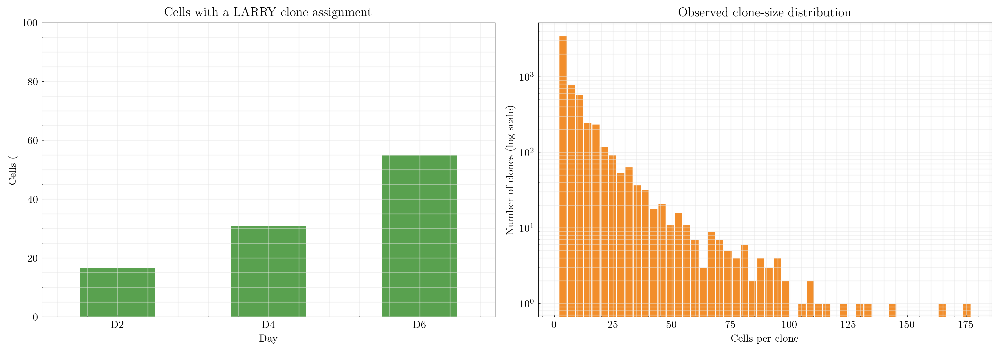

In [8]:
clone_rows = []
for day in day_order:
    mask = metadata["day_label"].eq(day).to_numpy()
    row_indices = np.flatnonzero(mask)
    clone_rows.append({
        "day": day,
        "cells": int(mask.sum()),
        "cells_with_clone": int(metadata.loc[mask, "has_clone"].sum()),
        "cells_with_single_clone": int(metadata.loc[mask, "has_single_clone"].sum()),
        "cells_with_multiple_clones": int(
            (metadata.loc[mask, "n_clone_assignments"] > 1).sum()
        ),
        "clone_coverage_percent": 100 * metadata.loc[mask, "has_clone"].mean(),
        "active_clones": int(
            np.count_nonzero(np.asarray(clone_matrix[row_indices].getnnz(axis=0)).ravel())
        ),
    })
clone_summary_by_day = pd.DataFrame(clone_rows).set_index("day")
display(clone_summary_by_day.round(2))

clone_coo = clone_matrix.tocoo()
clone_memberships = pd.DataFrame({
    "cell_index": clone_coo.row.astype(np.int64),
    "clone_id": clone_coo.col.astype(np.int64) + 1,
})
clone_memberships["day_label"] = metadata["day_label"].to_numpy()[clone_coo.row]
clone_memberships["cell_type"] = metadata["cell_type"].to_numpy()[clone_coo.row]
clone_memberships["starting_population"] = (
    metadata["starting_population"].to_numpy()[clone_coo.row]
)
clone_time_span = (
    clone_memberships[["clone_id", "day_label"]].drop_duplicates()
    .groupby("clone_id").size()
)
clone_overview = pd.Series({
    "Active clones": int((clone_sizes > 0).sum()),
    "Clones observed at multiple times": int((clone_time_span >= 2).sum()),
    "Clones observed at every time": int((clone_time_span == len(day_order)).sum()),
    "Median cells per active clone": float(np.median(clone_sizes[clone_sizes > 0])),
    "Largest clone (cells)": int(clone_sizes.max()),
}, name="value")
display(clone_overview.to_frame())

fig, axes = plt.subplots(1, 2, figsize=(13, 4.5), constrained_layout=True)
clone_summary_by_day["clone_coverage_percent"].plot(
    kind="bar", ax=axes[0], color="#59A14F"
)
axes[0].set(
    title="Cells with a LARRY clone assignment",
    xlabel="Day", ylabel="Cells (%)", ylim=(0, 100),
)
axes[0].tick_params(axis="x", rotation=0)
positive_sizes = clone_sizes[clone_sizes > 0]
axes[1].hist(
    positive_sizes,
    bins=min(50, max(10, int(np.sqrt(len(positive_sizes))))),
    color="#F28E2B", edgecolor="white",
)
axes[1].set_yscale("log")
axes[1].set(
    title="Observed clone-size distribution",
    xlabel="Cells per clone", ylabel="Number of clones (log scale)",
)
plt.show()

## Optional exploratory HVG/PCA representation

Set `RUN_EXPLORATORY_PCA = True` in the settings cell to compute a 50-dimensional exploratory representation. The source describes the matrix as total-count normalised rather than log-transformed, so this applies `log1p` before selecting highly variable genes.

For the held-out D4 benchmark, the training pipeline fits this same all-cell representation once using D2, D4, and D6 and saves it as `stateFate_inVitro_hvg2000_pca50.h5ad` for reuse (via `scripts/create_larry_hvg_pca.py`). D4 is held out only from flow-model training and remains included in the unsupervised HVG/PCA fit.

/opt/anaconda3/envs/flowmaps/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


Selected 2,000 HVGs; PCA shape: (130887, 50)


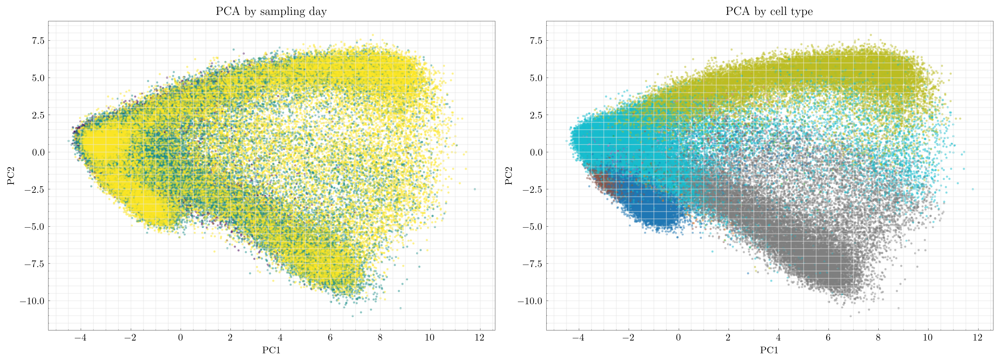

In [11]:
if RUN_EXPLORATORY_PCA:
    import anndata as ad
    import scanpy as sc

    adata = ad.AnnData(
        X=expression.copy(),
        obs=metadata.set_index("cell_id").copy(),
        var=pd.DataFrame(index=gene_names.astype(str)),
    )
    adata.var_names_make_unique()
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(
        adata,
        n_top_genes=min(N_HIGHLY_VARIABLE_GENES, adata.n_vars),
        flavor="seurat",
    )
    n_hvg = int(adata.var["highly_variable"].sum())
    n_components = min(N_PCS, n_hvg - 1, adata.n_obs - 1)
    sc.pp.pca(
        adata, n_comps=n_components, use_highly_variable=True,
        svd_solver="arpack", random_state=RANDOM_SEED,
    )
    print(f"Selected {n_hvg:,} HVGs; PCA shape: {adata.obsm['X_pca'].shape}")

    fig, axes = plt.subplots(1, 2, figsize=(14, 5), constrained_layout=True)
    day_codes = pd.Categorical(adata.obs["day_label"], categories=day_order).codes
    axes[0].scatter(
        adata.obsm["X_pca"][:, 0], adata.obsm["X_pca"][:, 1],
        c=day_codes, cmap="viridis", s=2, alpha=0.35, rasterized=True,
    )
    axes[0].set(title="PCA by sampling day", xlabel="PC1", ylabel="PC2")
    type_codes, _ = pd.factorize(adata.obs["cell_type"], sort=True)
    axes[1].scatter(
        adata.obsm["X_pca"][:, 0], adata.obsm["X_pca"][:, 1],
        c=type_codes, cmap="tab20", s=2, alpha=0.35, rasterized=True,
    )
    axes[1].set(title="PCA by cell type", xlabel="PC1", ylabel="PC2")
    plt.show()
else:
    print("Exploratory PCA skipped; set RUN_EXPLORATORY_PCA = True to run it.")

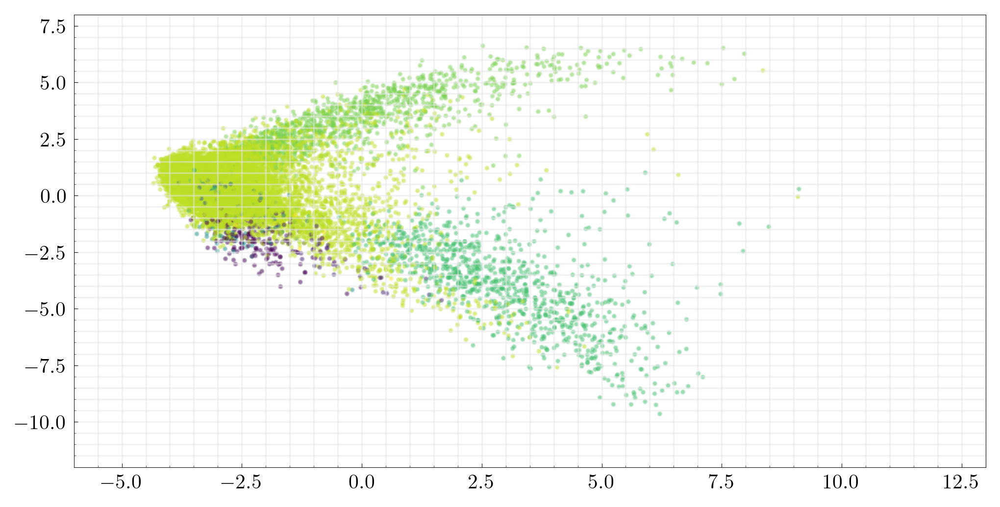

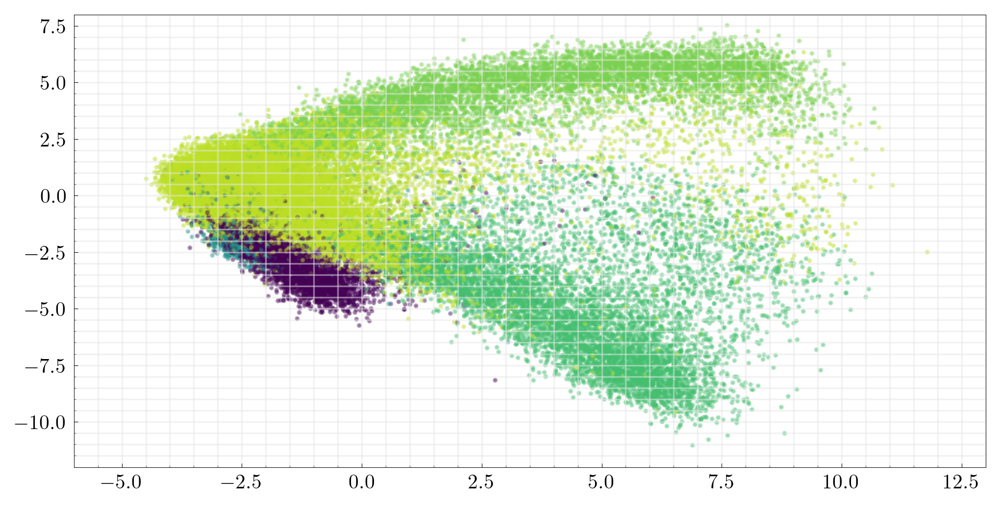

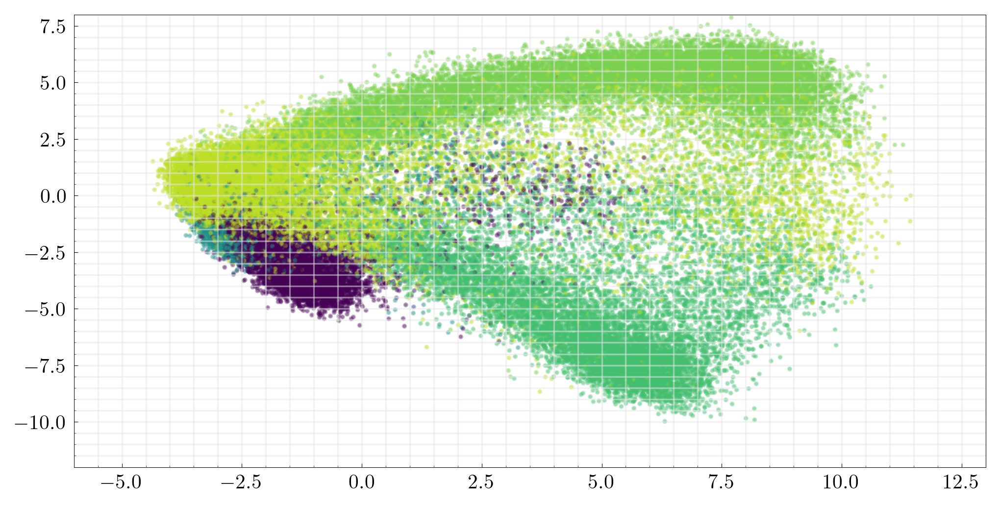

In [35]:
# plot each day separately from adata.obsm["X_pca"]

#plot only where adata.obs['day_label'] is D2, coloured by cell type

plt.scatter(
    adata.obsm["X_pca"][adata.obs['day_label'] == 'D2', 0],
    adata.obsm["X_pca"][adata.obs['day_label'] == 'D2', 1],
    c=pd.Categorical(adata.obs['cell_type'][adata.obs['day_label'] == 'D2']).codes,
    cmap='viridis',
    s=2,
    alpha=0.35,
    rasterized=True
)
plt.xlim(-6, 13)
plt.ylim(-12,8)
plt.show()

plt.scatter(
    adata.obsm["X_pca"][adata.obs['day_label'] == 'D4', 0],
    adata.obsm["X_pca"][adata.obs['day_label'] == 'D4', 1],
    c=pd.Categorical(adata.obs['cell_type'][adata.obs['day_label'] == 'D4']).codes,
    cmap='viridis',
    s=2,
    alpha=0.35,
    rasterized=True
)
plt.xlim(-6, 13)
plt.ylim(-12,8)
plt.show()

plt.scatter(
    adata.obsm["X_pca"][adata.obs['day_label'] == 'D6', 0],
    adata.obsm["X_pca"][adata.obs['day_label'] == 'D6', 1],
    c=pd.Categorical(adata.obs['cell_type'][adata.obs['day_label'] == 'D6']).codes,
    cmap='viridis',
    s=2,
    alpha=0.35,
    rasterized=True
)
plt.xlim(-6, 13)
plt.ylim(-12,8)
plt.show()


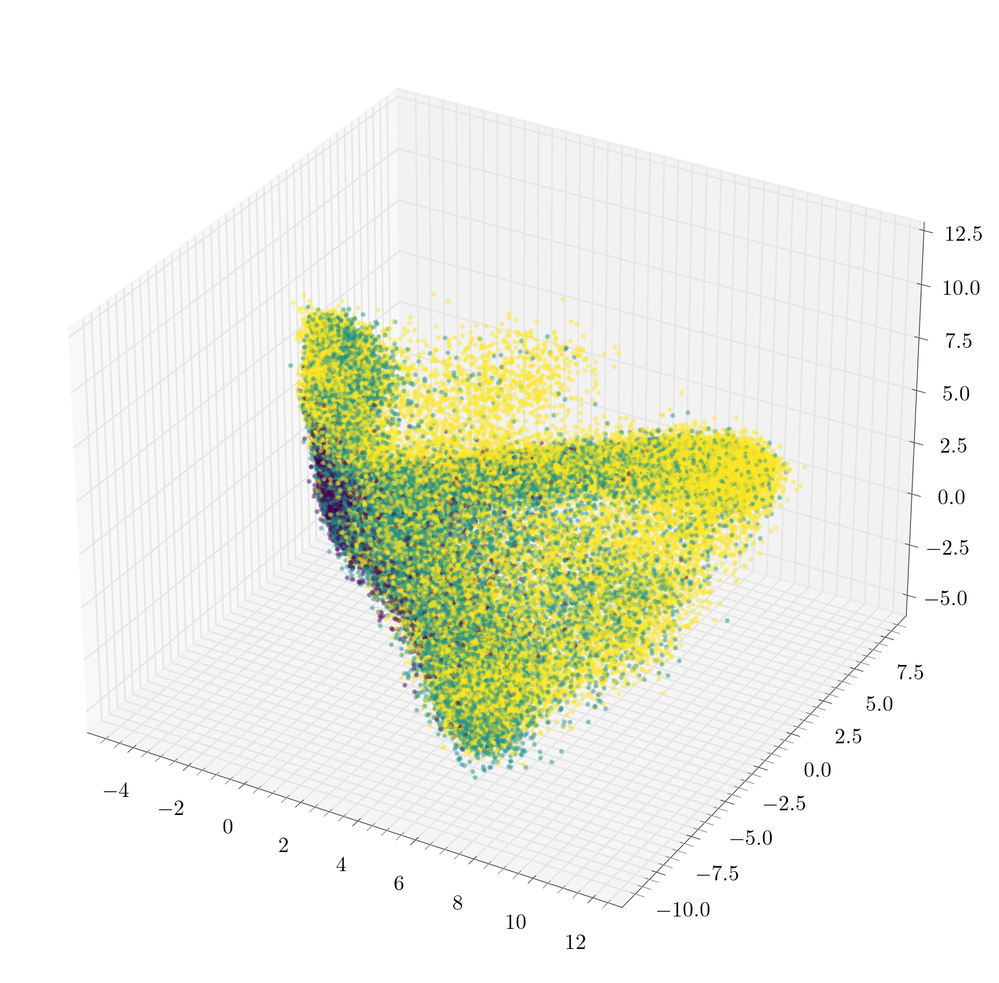

In [37]:
# plot a movable plot in 3D

plt.figure(figsize=(10, 8))
ax = plt.axes(projection='3d')
ax.scatter3D(
    adata.obsm["X_pca"][:, 0],
    adata.obsm["X_pca"][:, 1],
    adata.obsm["X_pca"][:, 2],
    c=pd.Categorical(adata.obs['day_label']).codes,
    cmap='viridis',
    s=2,
    alpha=0.35,
    rasterized=True
)